In [3]:
#Importing Libraries:
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Define constants
img_width, img_height = 150, 150
batch_size = 32
num_classes = 6


# Define paths
train_path = '/kaggle/input/intel-image-classification/seg_train/seg_train'
test_path = '/kaggle/input/intel-image-classification/seg_test/seg_test'
prediction_path = '/kaggle/input/intel-image-classification/seg_pred/seg_pred'

In [4]:
# Data augmentation for training
#create data generators for training and testing.
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
   train_path,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)


Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [5]:
# Define and compile models
#to create a custom model with a pre-trained base model (VGG16, ResNet50, InceptionV3).
def create_model(base_model):
    model = Sequential()
    model.add(base_model)
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))




    # Freeze the layers of the pre-trained model
    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Load pre-trained models
vgg_base = VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))
inception_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

# Create models
vgg_model = create_model(vgg_base)
resnet_model = create_model(resnet_base)
inception_model = create_model(inception_base)


87910968/87910968 [==============================] - 0s 0us/step


In [6]:
# Train models
def train_model(model, model_name, epochs=10):
    checkpoint = ModelCheckpoint(f'best_{model_name}_model.h5', save_best_only=True)
    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=test_generator,
        callbacks=[checkpoint]
    )
    return history

vgg_history = train_model(vgg_model, 'vgg', epochs=10)
resnet_history = train_model(resnet_model, 'resnet', epochs=10)
inception_history = train_model(inception_model, 'inception', epochs=10)



Epoch 1/10
439/439 [==============================] - 168s 359ms/step - loss: 0.5707 - accuracy: 0.7943 - val_loss: 0.3957 - val_accuracy: 0.8527
Epoch 2/10


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


439/439 [==============================] - 95s 217ms/step - loss: 0.4224 - accuracy: 0.8428 - val_loss: 0.3812 - val_accuracy: 0.8570
Epoch 3/10
439/439 [==============================] - 94s 214ms/step - loss: 0.3862 - accuracy: 0.8579 - val_loss: 0.3907 - val_accuracy: 0.8513
Epoch 4/10
439/439 [==============================] - 94s 215ms/step - loss: 0.3728 - accuracy: 0.8611 - val_loss: 0.4132 - val_accuracy: 0.8490
Epoch 5/10
439/439 [==============================] - 95s 215ms/step - loss: 0.3598 - accuracy: 0.8665 - val_loss: 0.3558 - val_accuracy: 0.8660
Epoch 6/10
439/439 [==============================] - 94s 214ms/step - loss: 0.3478 - accuracy: 0.8721 - val_loss: 0.3424 - val_accuracy: 0.8703
Epoch 7/10
439/439 [==============================] - 94s 215ms/step - loss: 0.3329 - accuracy: 0.8752 - val_loss: 0.3482 - val_accuracy: 0.8653
Epoch 8/10
439/439 [==============================] - 95s 216ms/step - loss: 0.3240 - accuracy: 0.8807 - val_loss: 0.3345 - val_accuracy: 0.8

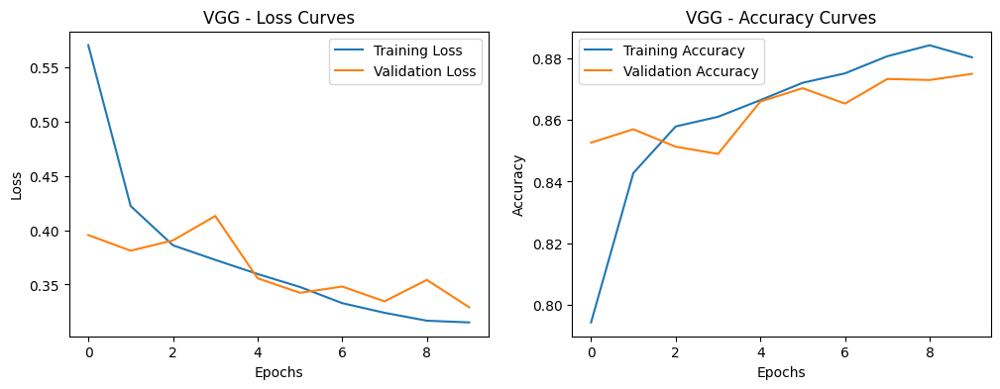

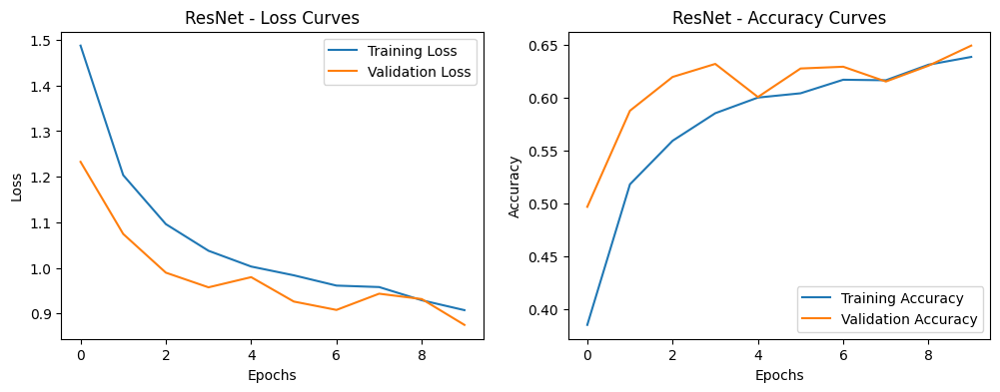

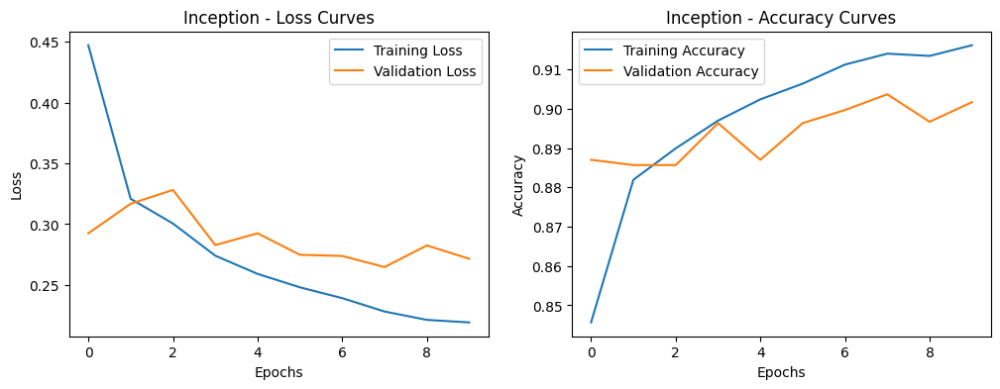

94/94 [==============================] - 6s 48ms/step - loss: 0.2647 - accuracy: 0.9037
VGG - Test Loss: 0.32903048396110535 Test Accuracy: 0.875
ResNet - Test Loss: 0.8750909566879272 Test Accuracy: 0.6496666669845581
Inception - Test Loss: 0.26468849182128906 Test Accuracy: 0.9036666750907898


In [7]:
# Plot loss and accuracy curves
def plot_curves(history, model_name):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} - Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} - Accuracy Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

plot_curves(vgg_history, 'VGG')
plot_curves(resnet_history, 'ResNet')
plot_curves(inception_history, 'Inception')



# Load the best weights for evaluation
best_vgg_model = load_model('best_vgg_model.h5')
best_resnet_model = load_model('best_resnet_model.h5')
best_inception_model = load_model('best_inception_model.h5')

# Evaluate models on the test set
vgg_eval = best_vgg_model.evaluate(test_generator)
resnet_eval = best_resnet_model.evaluate(test_generator)
inception_eval = best_inception_model.evaluate(test_generator)

print("VGG - Test Loss:", vgg_eval[0], "Test Accuracy:", vgg_eval[1])
print("ResNet - Test Loss:", resnet_eval[0], "Test Accuracy:", resnet_eval[1])
print("Inception - Test Loss:", inception_eval[0], "Test Accuracy:", inception_eval[1])


1/1 [==============================] - 0s 19ms/step


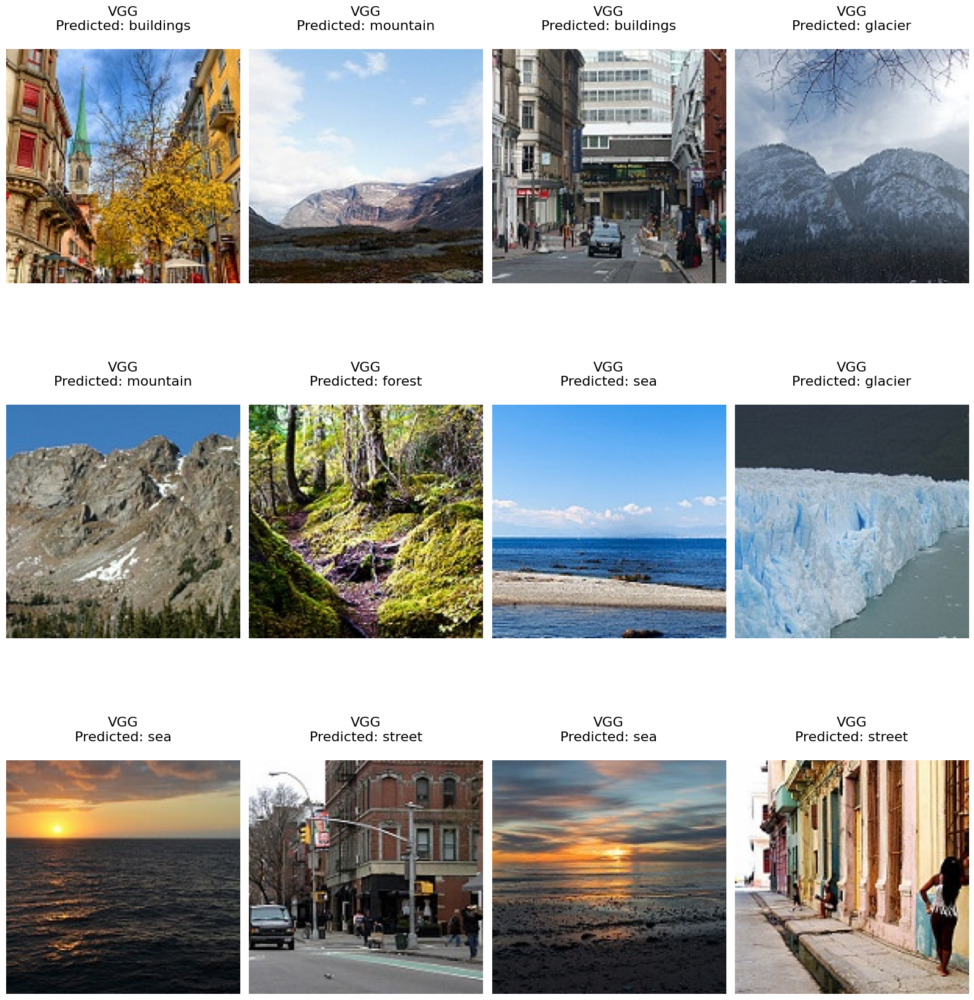

1/1 [==============================] - 0s 23ms/step


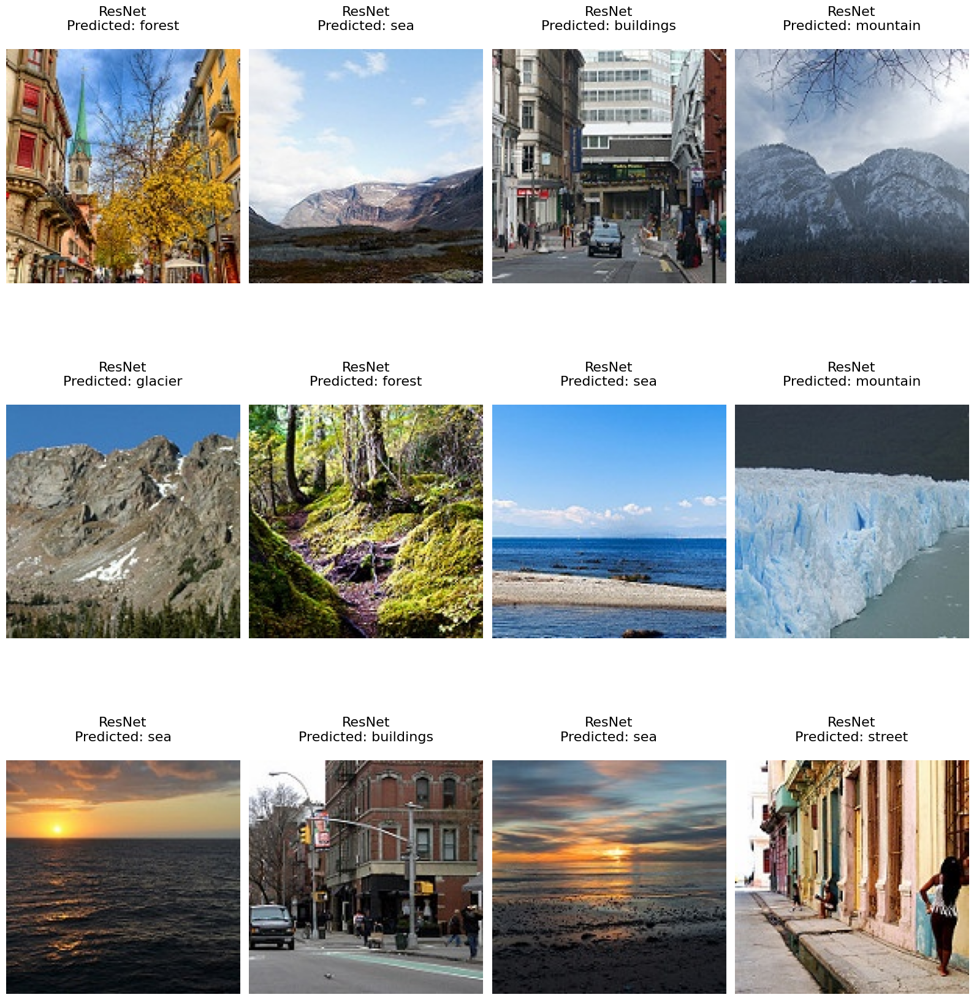

1/1 [==============================] - 0s 26ms/step


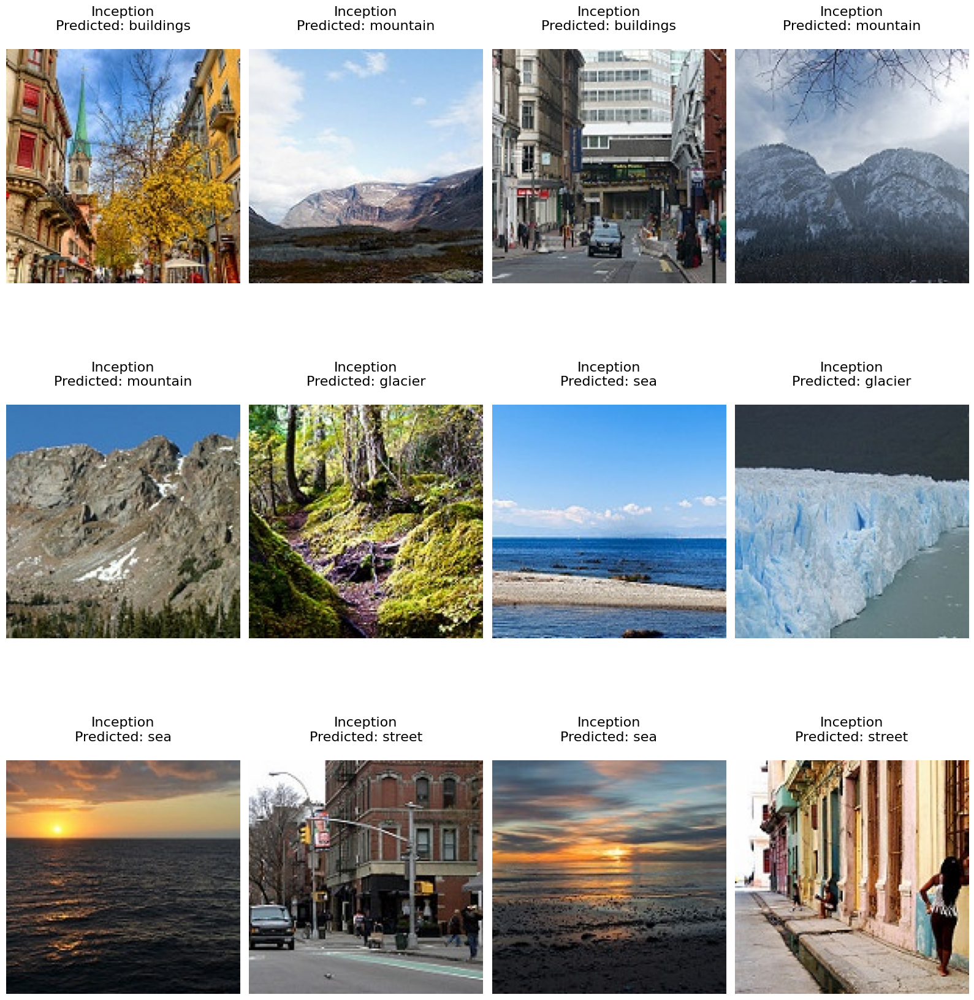

In [15]:
from tensorflow.keras.preprocessing import image

# Function to make predictions and display images with class names
def display_predictions_with_names(model, model_name, image_paths, class_names):
    num_images = len(image_paths)
    num_rows = (num_images // 4) + 1  # Adjust the number of rows based on the number of images
    plt.figure(figsize=(16, 6 * num_rows))  # Adjust the figure size based on the number of rows

    for i, image_path in enumerate(image_paths):
        plt.subplot(num_rows, 4, i + 1)  # Adjust the number of columns to 4

        # Load and preprocess the image
        img = image.load_img(image_path, target_size=(img_width, img_height))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0

        # Make predictions
        predictions = model.predict(img_array)
        predicted_class_index = np.argmax(predictions)
        predicted_class_name = class_names[predicted_class_index]

        # Display the image, predicted class index, and predicted class name
        plt.imshow(img)
        plt.title(f'{model_name}\nPredicted: {predicted_class_name}\n', fontsize=16)
        plt.axis('off')  # Turn off axis for cleaner display

    plt.tight_layout()
    plt.show()

# Retrieve class names from the data generator
class_names = list(train_generator.class_indices.keys())

# Paths to 12 images from the prediction set
prediction_image_paths = [
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10004.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10005.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10012.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10013.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10017.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10021.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/1003.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10034.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10038.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10040.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10043.jpg',
    '/kaggle/input/intel-image-classification/seg_pred/seg_pred/10045.jpg'
]


# Display predictions for each model with class names
display_predictions_with_names(best_vgg_model, 'VGG', prediction_image_paths, class_names)
display_predictions_with_names(best_resnet_model, 'ResNet', prediction_image_paths, class_names)
display_predictions_with_names(best_inception_model, 'Inception', prediction_image_paths, class_names)